In [22]:
pip install yfinance --upgrade --no-cache-dir

In [24]:
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import plotly.offline as pyo
import quandl
import yfinance as yf
import pylab
import seaborn as sns #built on top of matplotlib and is useful in providing useful interface for showing results
from datetime import datetime #for data retrival of MnC's finances
from pandas_datareader import data

pd.options.plotting.backend='plotly'

In [107]:
# Define a list of stock tickers
stock_tickers = ['AAPL', 'MSFT', 'GOOGL', 'TSLA', 'MET', 'NVDA', 'AMZN']

# Setting the beginning and ending dates
today = datetime.now()
year_ago = datetime(today.year - 2, today.month, today.day)  # starting date= one year prior to current date

# Download historical data for the specified stocks and store them in separate DataFrames
stock_data = {}
for ticker in stock_tickers:
    stock_data[ticker] = yf.download(ticker, start=year_ago, end=today)

# Print the first few rows of each DataFrame
for ticker, data in stock_data.items():
    print(f"\n{ticker} Data:")
    print(data.head())


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


AAPL Data:
                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2022-02-14  167.369995  169.580002  166.559998  168.880005  166.971893   
2022-02-15  170.970001  172.949997  170.250000  172.789993  170.837708   
2022-02-16  171.850006  173.339996  170.050003  172.550003  170.600418   
2022-02-17  171.029999  171.910004  168.470001  168.880005  166.971893   
2022-02-18  169.820007  170.539993  166.190002  167.300003  165.409729   

              Volume  
Date                  
2022-02-14  86185500  
2022-02-15  62527400  
2022-02-16  61177400  
2022-02-17  69589300  
2022-02-18  82772700  

MSFT Data:
                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2022-02-14  293.769989  296.760010  291.350006  295.000000  289.692780   
2022-02-15  300.010010  300.799988  297.019989  300.470001  295.064362   


In [108]:
# Accessing individual DataFrames from the dictionary
aapl_df = stock_data['AAPL']  # Accessing DataFrame for AAPL
msft_df = stock_data['MSFT']  # Accessing DataFrame for MSFT
met_df = stock_data['MET']  # Accessing DataFrame for MET
amzn_df = stock_data['AMZN']  # Accessing DataFrame for AMZN
nvda_df = stock_data['NVDA']  # Accessing DataFrame for NVDA
googl_df = stock_data['GOOGL']  # Accessing DataFrame for GOOGL
tsla_df = stock_data['TSLA'] # Accessing DataFrame for TSLA

In [109]:
print("AAPL Data:")
print(aapl_df.head())

AAPL Data:
                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2022-02-14  167.369995  169.580002  166.559998  168.880005  166.971893   
2022-02-15  170.970001  172.949997  170.250000  172.789993  170.837708   
2022-02-16  171.850006  173.339996  170.050003  172.550003  170.600418   
2022-02-17  171.029999  171.910004  168.470001  168.880005  166.971893   
2022-02-18  169.820007  170.539993  166.190002  167.300003  165.409729   

              Volume  
Date                  
2022-02-14  86185500  
2022-02-15  62527400  
2022-02-16  61177400  
2022-02-17  69589300  
2022-02-18  82772700  


In [110]:
aapl_df.info

<bound method DataFrame.info of                   Open        High         Low       Close   Adj Close  \
Date                                                                     
2022-02-14  167.369995  169.580002  166.559998  168.880005  166.971893   
2022-02-15  170.970001  172.949997  170.250000  172.789993  170.837708   
2022-02-16  171.850006  173.339996  170.050003  172.550003  170.600418   
2022-02-17  171.029999  171.910004  168.470001  168.880005  166.971893   
2022-02-18  169.820007  170.539993  166.190002  167.300003  165.409729   
...                ...         ...         ...         ...         ...   
2024-02-07  190.639999  191.050003  188.610001  189.410004  189.168625   
2024-02-08  189.389999  189.539993  187.350006  188.320007  188.080017   
2024-02-09  188.649994  189.990005  188.000000  188.850006  188.850006   
2024-02-12  188.419998  188.669998  186.789993  187.149994  187.149994   
2024-02-13  185.770004  186.210007  183.509995  185.039993  185.039993   

     

In [111]:
# Print summary for each DataFrame
for ticker, data in stock_data.items():
    print(f"\n{ticker} DataFrame Summary:")
    print(data.describe())


AAPL DataFrame Summary:
             Open        High         Low       Close   Adj Close  \
count  502.000000  502.000000  502.000000  502.000000  502.000000   
mean   164.491753  166.316713  162.850438  164.691275  163.723998   
std     18.523228   18.205941   18.760553   18.496932   18.756662   
min    126.010002  127.769997  124.169998  125.019997  124.166641   
25%    148.877495  150.924999  147.252502  149.362503  148.131199   
50%    165.010002  166.600006  163.775002  165.340004  164.144035   
75%    179.104996  180.262505  177.347504  179.050007  178.521297   
max    198.020004  199.619995  197.000000  198.110001  197.857529   

             Volume  
count  5.020000e+02  
mean   7.113739e+07  
std    2.437328e+07  
min    2.404830e+07  
25%    5.303505e+07  
50%    6.665190e+07  
75%    8.344945e+07  
max    1.826020e+08  

MSFT DataFrame Summary:
             Open        High         Low       Close   Adj Close  \
count  502.000000  502.000000  502.000000  502.000000  502.00

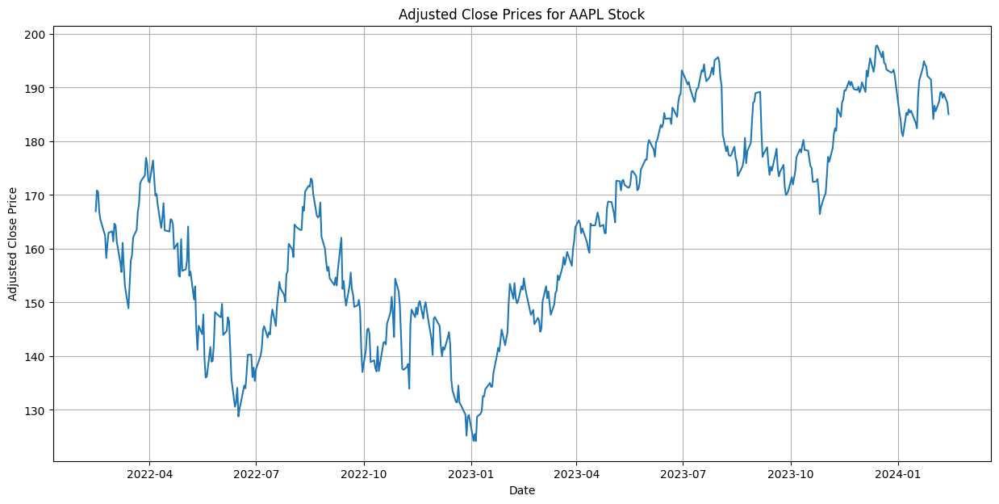

In [112]:
# Plotting adjusted close prices for AAPL
plt.figure(figsize=(15,7))
plt.plot(stock_data['AAPL']['Adj Close'])  # Assuming the key for AAPL data is 'AAPL'
plt.xlabel('Date')
plt.ylabel('Adjusted Close Price')
plt.title('Adjusted Close Prices for AAPL Stock')
plt.grid()
plt.show()

In [114]:
print('First',aapl_df.Close[0],'End', aapl_df.Close[501])
#Here we can see how the prices varied, intial vs closing

First 168.8800048828125 End 185.0399932861328


In [115]:
# Calculate log returns for AAPL
log_returns = np.log(stock_data['AAPL']['Close'] / stock_data['AAPL']['Close'].shift(1)).dropna()

# Print the log returns
print(log_returns)


Date
2022-02-15    0.022889
2022-02-16   -0.001390
2022-02-17   -0.021499
2022-02-18   -0.009400
2022-02-22   -0.017973
                ...   
2024-02-07    0.000581
2024-02-08   -0.005771
2024-02-09    0.002810
2024-02-12   -0.009043
2024-02-13   -0.011338
Name: Close, Length: 501, dtype: float64


In [116]:
log_returns.mean()

0.0001824022937861828

In [117]:
aapl_df.Close[0]*(np.exp(log_returns.mean()*len(log_returns)))

185.03999328613276

In [118]:
# Calculate simple returns for AAPL
simple_returns = stock_data['AAPL']['Close'].pct_change().dropna()

# Print the simple returns
print(simple_returns)

Date
2022-02-15    0.023152
2022-02-16   -0.001389
2022-02-17   -0.021269
2022-02-18   -0.009356
2022-02-22   -0.017812
                ...   
2024-02-07    0.000581
2024-02-08   -0.005755
2024-02-09    0.002814
2024-02-12   -0.009002
2024-02-13   -0.011274
Name: Close, Length: 501, dtype: float64


In [119]:
simple_returns.mean()

0.00034432426929137915

In [120]:
aapl_df.Close[0]*(np.prod([(1+Rt) for Rt in simple_returns]))

185.03999328613284

In [121]:
#Histogram of log returns
log_returns.plot(kind='hist')

In [122]:
# lets take the best and the worst case and see the std deviation and the probability of occurances if its assumed to be normal
log_returns_sorted=log_returns.tolist()
log_returns_sorted.sort()
# Here we sorted all the log returns according to their value,
# to get the lowest and the highest case (the leftmost and the Rightmost case in the Histogram)

worst=log_returns_sorted[0]
best=log_returns_sorted[-1]

std_worst=(worst-log_returns.mean())/log_returns.std()
std_best=(best-log_returns.mean())/log_returns.std()
# here we normalise it

print('Std dev. worst %.2f best %.2f' %(std_worst,std_best))

Std dev. worst -3.37 best 4.72


Testing for normality

Q-Q PLOT


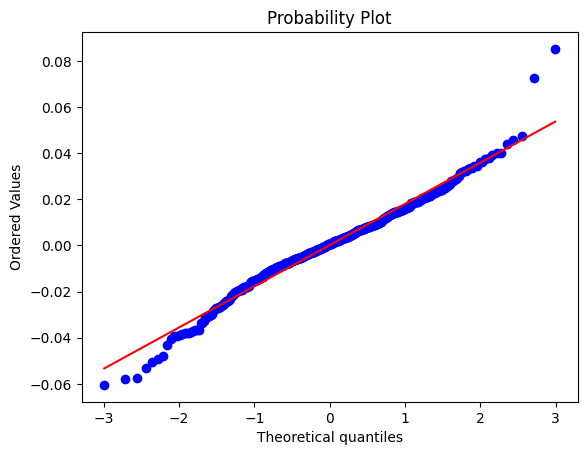

In [123]:
stats.probplot(log_returns, dist='norm', plot=pylab)
print('Q-Q PLOT')

In [127]:
nvda_df['Adj Close'].plot()

In [125]:
msft_df['Adj Close'].plot()

In [126]:
met_df['Adj Close'].plot()

In [128]:
amzn_df['Adj Close'].plot()

In [129]:
tsla_df['Adj Close'].plot()

In [130]:
googl_df['Adj Close'].plot()

Incorporating moving averages to mitigate fluctuations, a process known as smoothing of time series, aimed at reducing the level of variations in the data. The primary benefit of Simple Moving Averages (SMA) lies in its provision of a smoothed line, which is less susceptible to whipsawing. It is often preferred by traders who operate on longer time frames, such as daily or weekly charts."






In [131]:
#Number of days for which moving average will be calculated
MA_days = [5, 10, 15]

for ma in MA_days:
    ma_str = "MA: {}".format(ma)
    aapl_df[ma_str] = aapl_df['Adj Close'].rolling(ma).mean()
    met_df[ma_str] = met_df['Adj Close'].rolling(ma).mean()
    msft_df[ma_str] = msft_df['Adj Close'].rolling(ma).mean()
    amzn_df[ma_str] = amzn_df['Adj Close'].rolling(ma).mean()
    nvda_df[ma_str] = nvda_df['Adj Close'].rolling(ma).mean()
    tsla_df[ma_str] = tsla_df['Adj Close'].rolling(ma).mean()
    googl_df[ma_str] = googl_df['Adj Close'].rolling(ma).mean()

In [132]:
def plot_graphic(company, company_string):
    plt.figure(figsize=(15, 6))
    plt.plot(company['Adj Close'])
    plt.plot(company['MA: 5'])
    plt.plot(company['MA: 10'])
    plt.plot(company['MA: 15'])

    plt.title(company_string)
    plt.xlabel('Date')
    plt.ylabel('Price')

    plt.legend(('Adj Close','MA: 5', 'MA: 10', 'MA:15'))
    plt.grid()
    plt.show()

In [133]:
company_list = ['aapl_df', 'met_df', 'msft_df', 'nvda_df', 'amzn_df', 'googl_df', 'tsla_df']

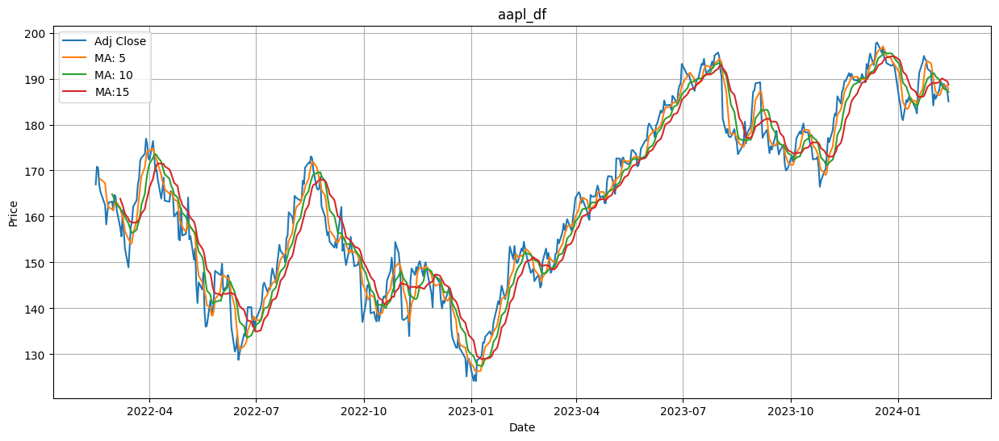

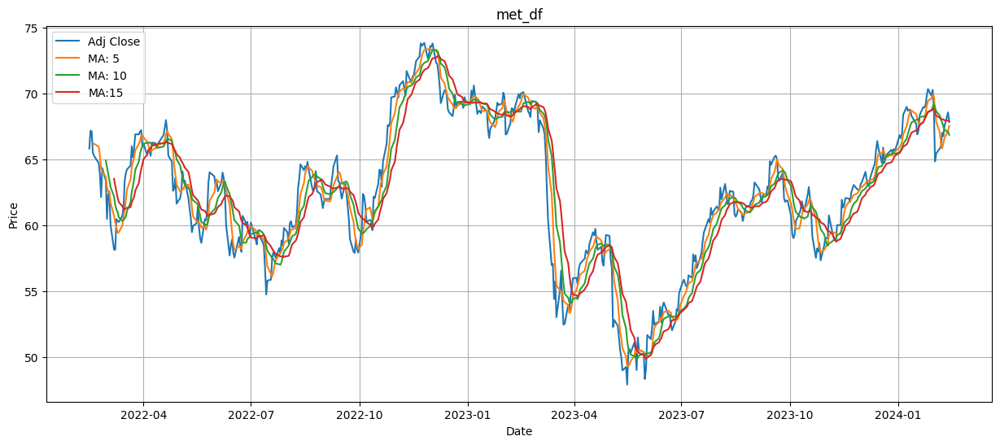

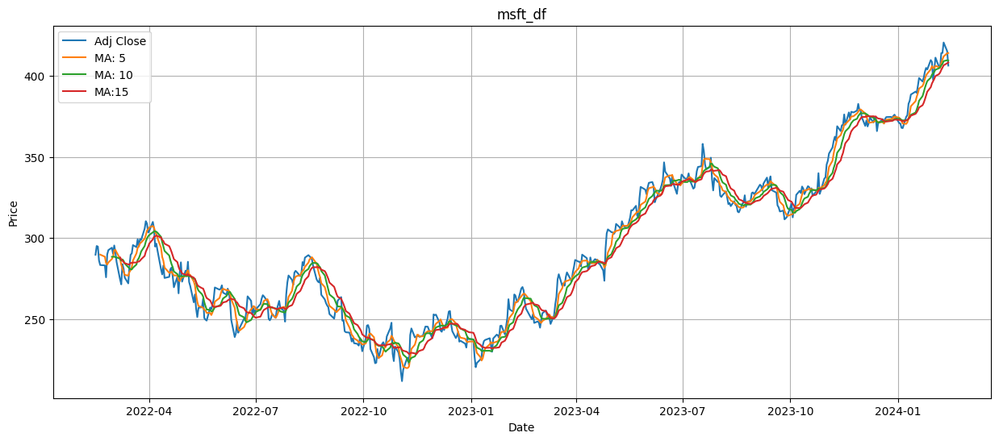

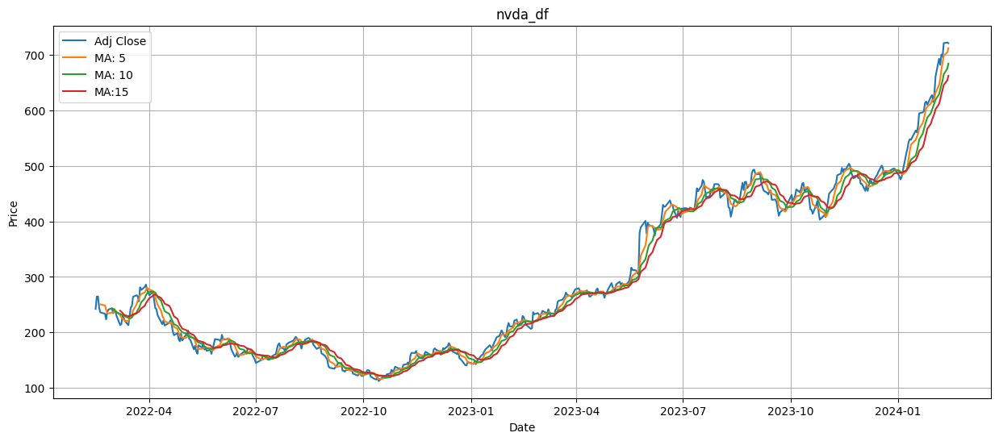

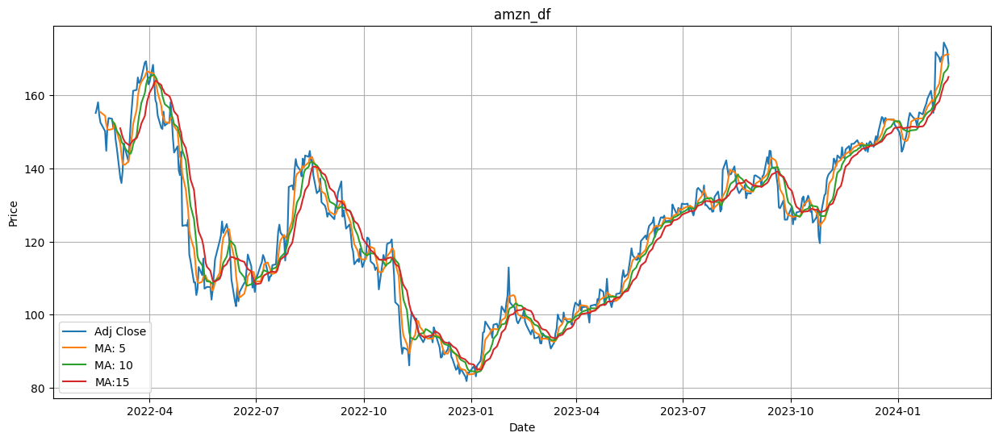

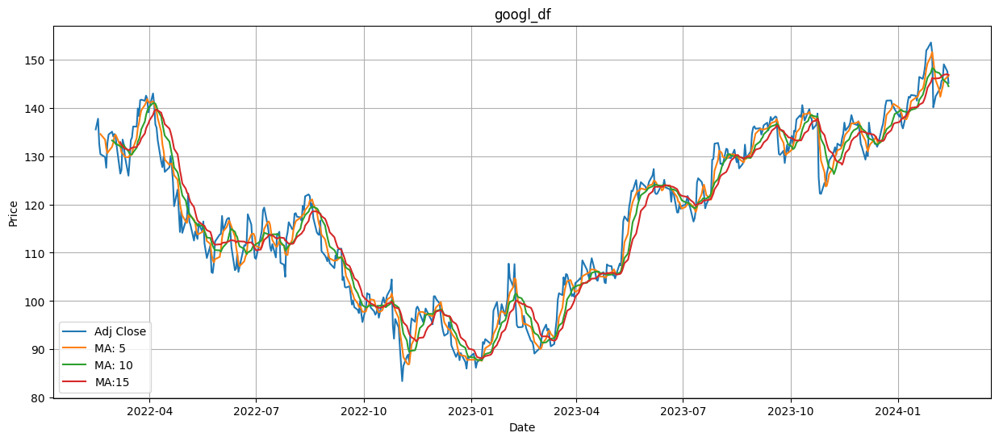

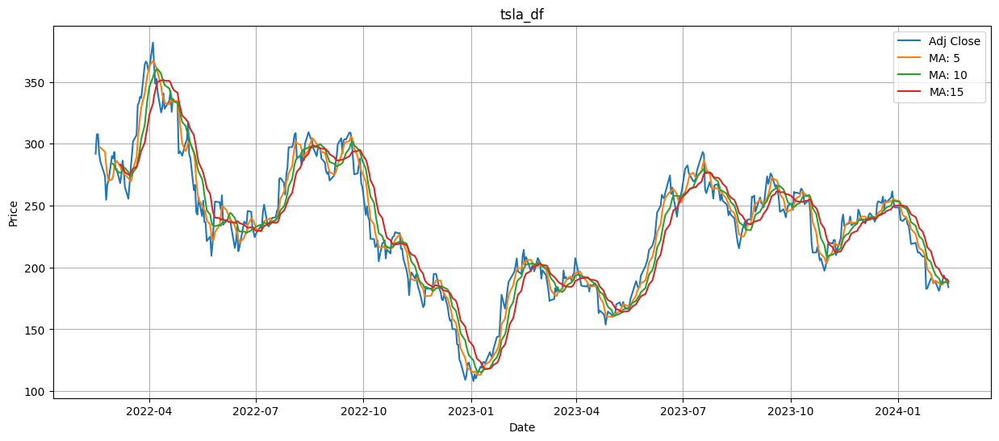

In [134]:
data_list = [aapl_df, met_df, msft_df, nvda_df, amzn_df, googl_df, tsla_df]

for i in range(len(data_list)):
    plot_graphic(data_list[i], company_list[i])

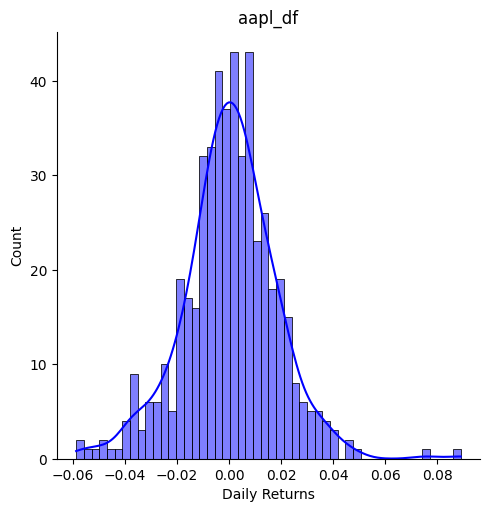

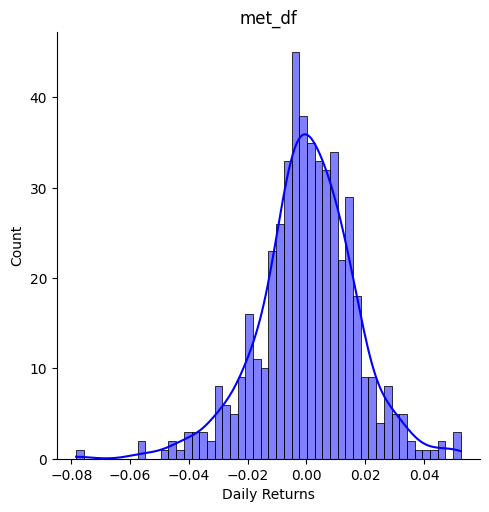

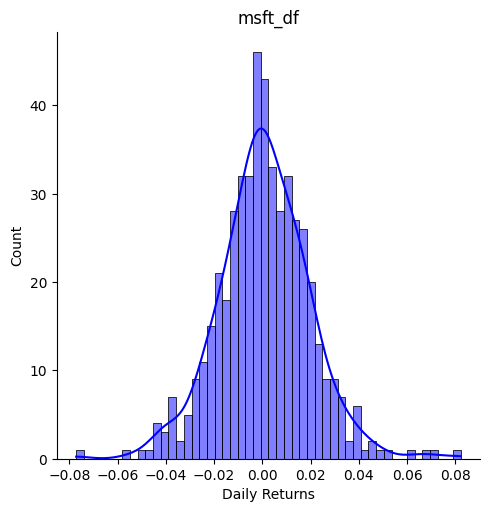

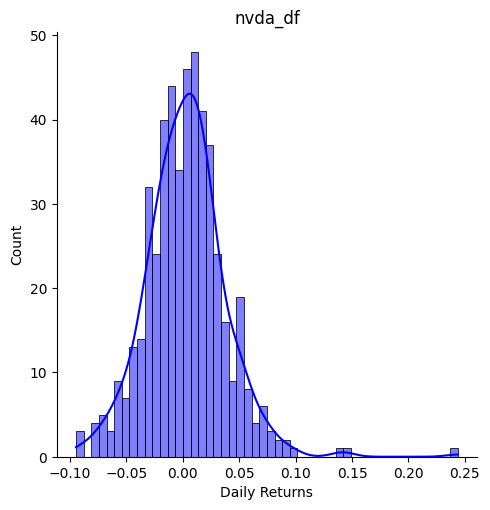

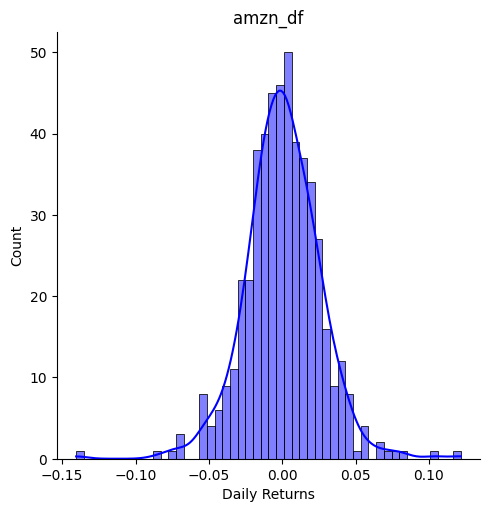

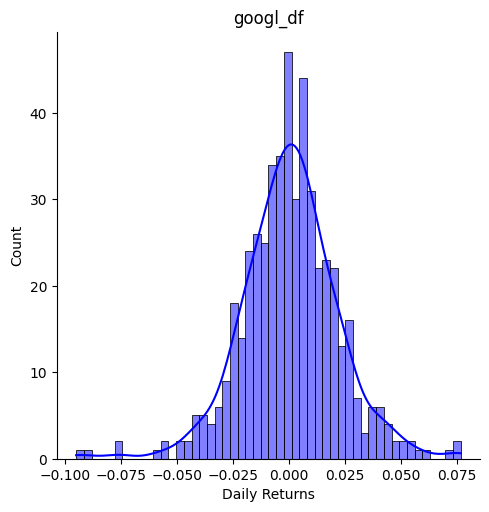

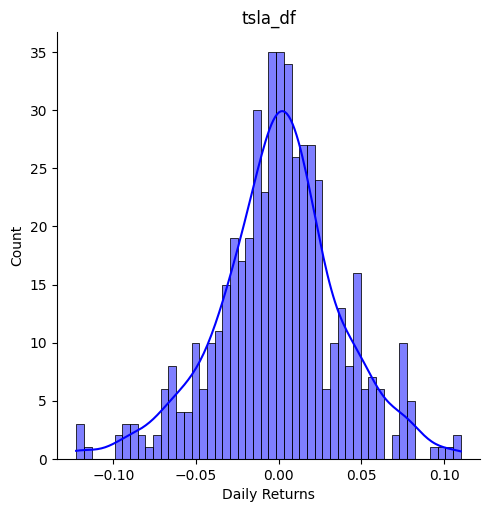

In [135]:
# Calculate returns and draw distribution

for i in range(len(data_list)):
    data_list[i]['Daily Returns'] = data_list[i]['Adj Close'].pct_change()
    sns.displot(data_list[i]['Daily Returns'].dropna(), bins=50, color='blue', kde=True)
    plt.title(company_list[i])
    plt.show()

In [136]:
import pandas as pd

# Assuming data_list is a list of dictionaries with 'Daily Returns' as a key and the values are pandas Series
daily_returns_list = [data['Daily Returns'] for data in data_list]

# Concatenate the daily return series along the columns axis
stock_returns = pd.concat(daily_returns_list, axis=1)

# Set the columns names to match the company_list
stock_returns.columns = company_list

# Display the first few rows of the resulting DataFrame
stock_returns.head()

,aapl_df,met_df,msft_df,nvda_df,amzn_df,googl_df,tsla_df
Date,,,,,,,
2022-02-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-02-15,0.023152,0.020533,0.018542,0.091812,0.008658,0.007987,0.053291
2022-02-16,-0.001389,-0.000559,-0.001167,0.000604,0.010159,0.008268,0.001041
2022-02-17,-0.021269,-0.024046,-0.029282,-0.075591,-0.021809,-0.037746,-0.050943
2022-02-18,-0.009356,-0.003724,-0.009631,-0.035296,-0.013262,-0.016116,-0.022103


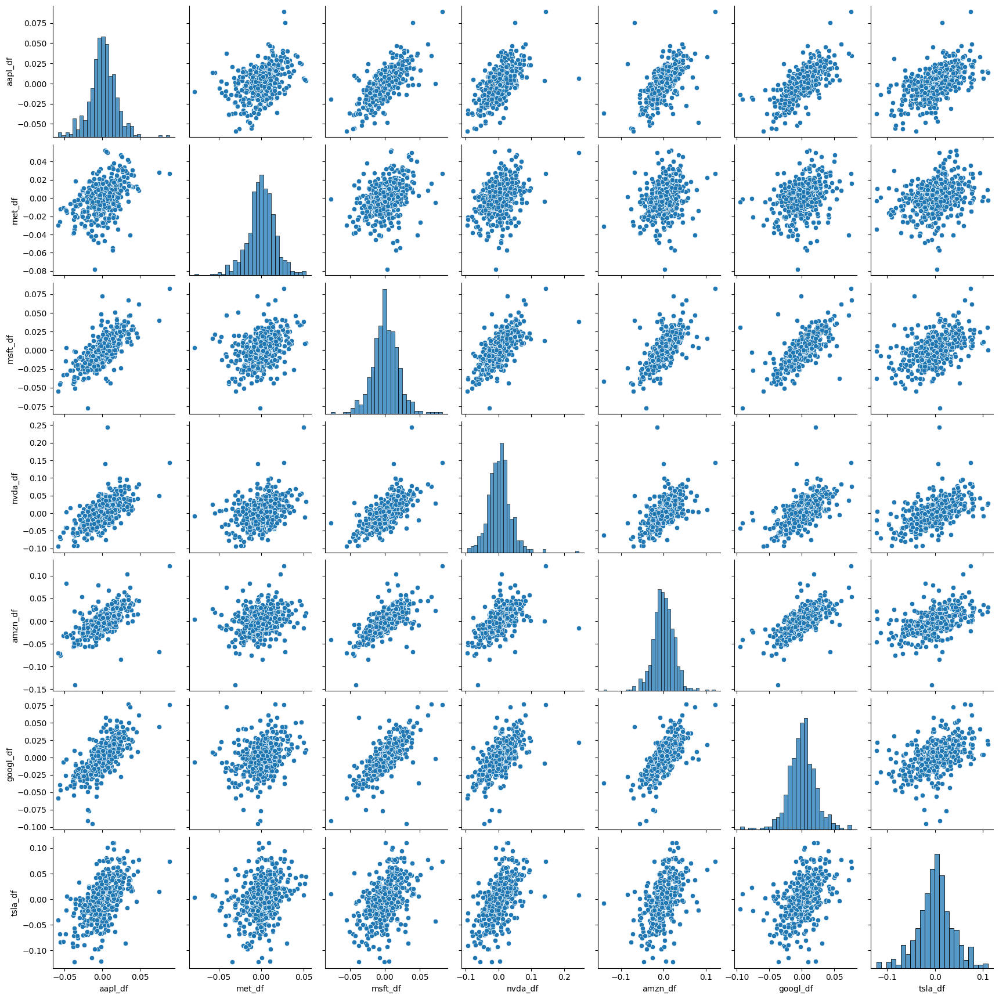

In [137]:
sns.pairplot(stock_returns.dropna())

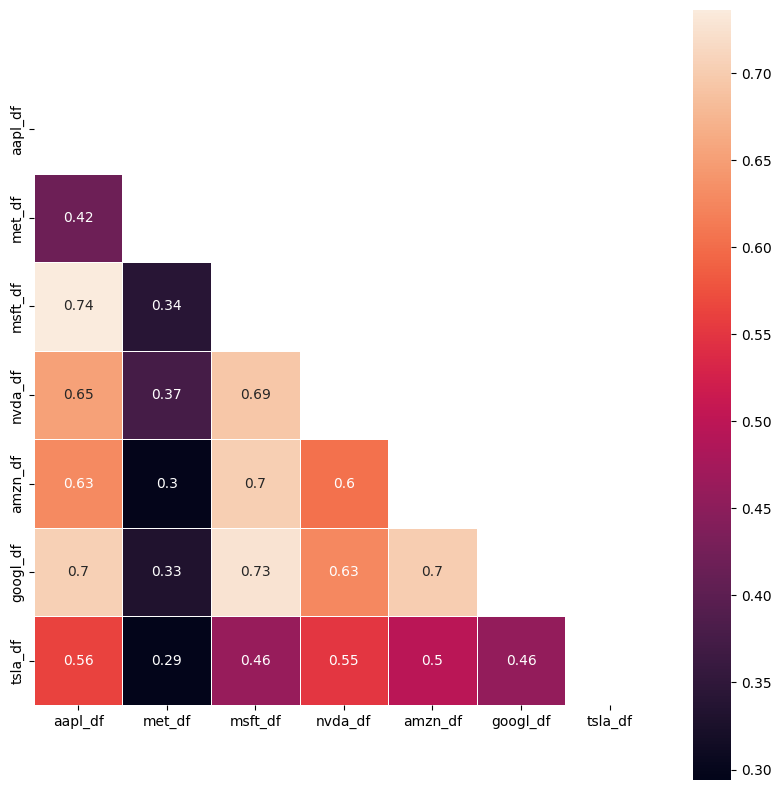

In [139]:
# Build correlation matrix
corr = stock_returns.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(10, 10))
sns.heatmap(corr, mask=mask,  square=True, linewidths=.5, annot=True)
plt.show()

In [140]:
mean_income = stock_returns.mean() # Mean income for each stock
cov_returns = stock_returns.cov() # Covariation
count = len(stock_returns.columns)
print(mean_income, cov_returns, sep='\n')

aapl_df     0.000367
met_df      0.000200
msft_df     0.000854
nvda_df     0.002779
amzn_df     0.000500
googl_df    0.000371
tsla_df    -0.000224
dtype: float64
           aapl_df    met_df   msft_df   nvda_df   amzn_df  googl_df   tsla_df
aapl_df   0.000325  0.000125  0.000251  0.000411  0.000292  0.000274  0.000377
met_df    0.000125  0.000278  0.000108  0.000218  0.000128  0.000119  0.000182
msft_df   0.000251  0.000108  0.000359  0.000460  0.000344  0.000298  0.000325
nvda_df   0.000411  0.000218  0.000460  0.001224  0.000546  0.000475  0.000717
amzn_df   0.000292  0.000128  0.000344  0.000546  0.000667  0.000392  0.000477
googl_df  0.000274  0.000119  0.000298  0.000475  0.000392  0.000468  0.000369
tsla_df   0.000377  0.000182  0.000325  0.000717  0.000477  0.000369  0.001386


In [141]:
# Function, that generate random shares
def randomPortfolio():
    share = np.exp(np.random.randn(count))
    share = share / share.sum()
    return share

In [142]:
def IncomePortfolio(Rand):
    return np.matmul(mean_income.values, Rand)


def RiskPortfolio(Rand):
    return np.sqrt(np.matmul(np.matmul(Rand, cov_returns.values), Rand))

In [143]:
combinations = 10000
risk = np.zeros(combinations)
income = np.zeros(combinations)
portfolio = np.zeros((combinations, count))

# Function, which create new combinations of shares
for i in range(combinations):
    rand = randomPortfolio()

    portfolio[i, :] = rand
    risk[i] = RiskPortfolio(rand)
    income[i] = IncomePortfolio(rand)

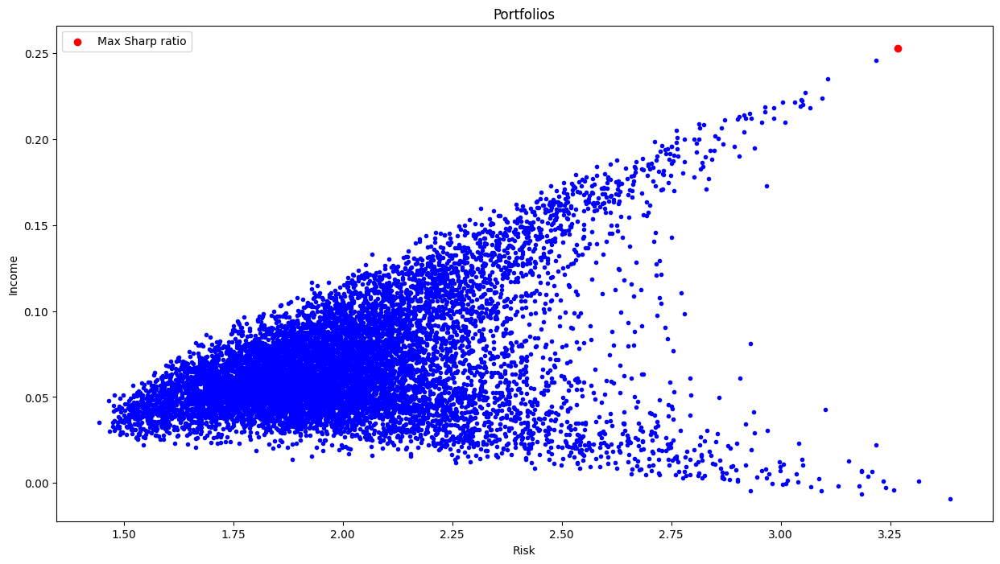

In [144]:
plt.figure(figsize=(15, 8))

plt.scatter(risk * 100, income * 100, c="b", marker=".")
plt.xlabel("Risk")
plt.ylabel("Income")
plt.title("Portfolios")
MaxSharpRatio = np.argmax(income / risk)
plt.scatter([risk[MaxSharpRatio] * 100], [income[MaxSharpRatio] * 100], c="r", marker="o", label="Max Sharp ratio")

plt.legend()
plt.show()


In [145]:
best_port = portfolio[MaxSharpRatio]
for i in range(len(company_list)):
    print("{} : {}".format(company_list[i], best_port[i]))

aapl_df : 0.011953027880740878
met_df : 0.028836735327553636
msft_df : 0.023732487256390527
nvda_df : 0.8964844973514222
amzn_df : 0.009841640734323007
googl_df : 0.013347224899848643
tsla_df : 0.015804386549721095


In [147]:
days = 252
dt = 1 / days
stock_returns.dropna(inplace=True)

mu = stock_returns.mean()
sigma = stock_returns.std()

In [148]:
def monte_carlo(start_price, days, mu, sigma):
    price = np.zeros(days)
    price[0] = start_price

    shock = np.zeros(days)
    drift = np.zeros(days)

    for x in range(1, days):
        shock[x] = np.random.normal(loc=mu * dt, scale=sigma*np.sqrt(dt))
        drift[x] = mu * dt

        price[x] = price[x-1] + (price[x-1] * (drift[x] + shock[x]))

    return price

In [189]:
len(monte_carlo(168.88, days, mu['aapl_df'], sigma['aapl_df']))

252

In [196]:
result = monte_carlo(168.88, days, mu['aapl_df'], sigma['aapl_df'])

In [198]:
sim = np.zeros(10)
sim[0] = result[251]

Text(0.5, 1.0, 'Monte Carlo analysis for Apple')

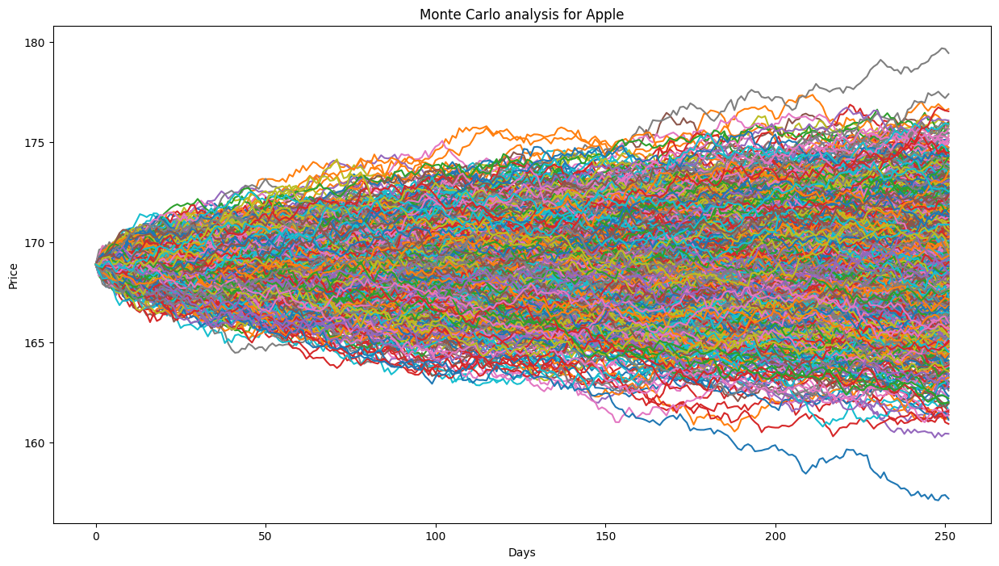

In [201]:
start_price = 168.88
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['aapl_df'], sigma['aapl_df'])
    sim[i] = result[days - 1]
    plt.plot(result)

plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Apple')

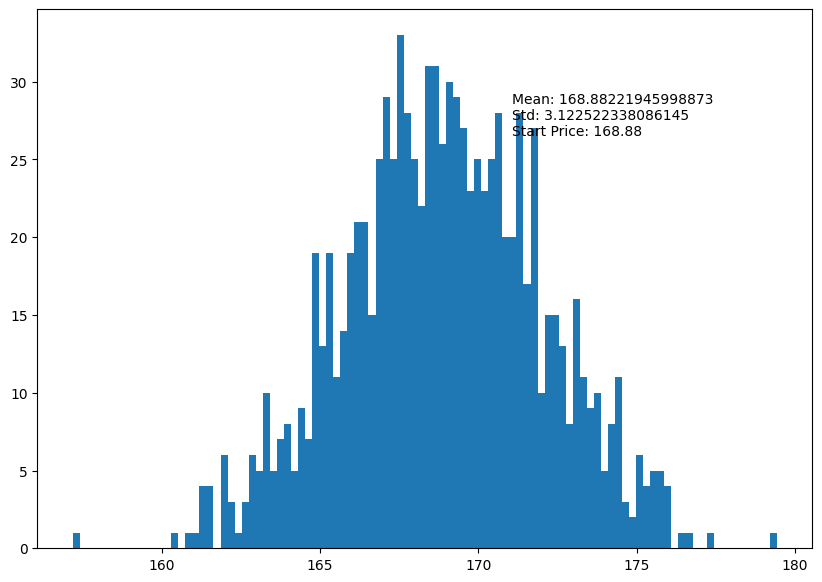

In [202]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for NVDIA')

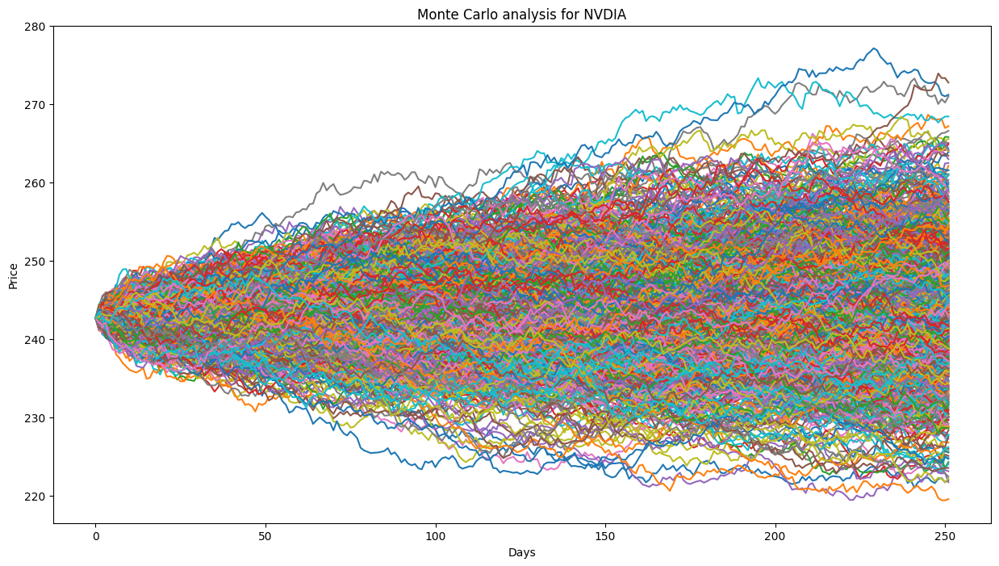

In [203]:
start_price = 242.669
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['nvda_df'], sigma['nvda_df'])
    sim[i] = result[days - 1]
    plt.plot(result)

plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for NVDIA')

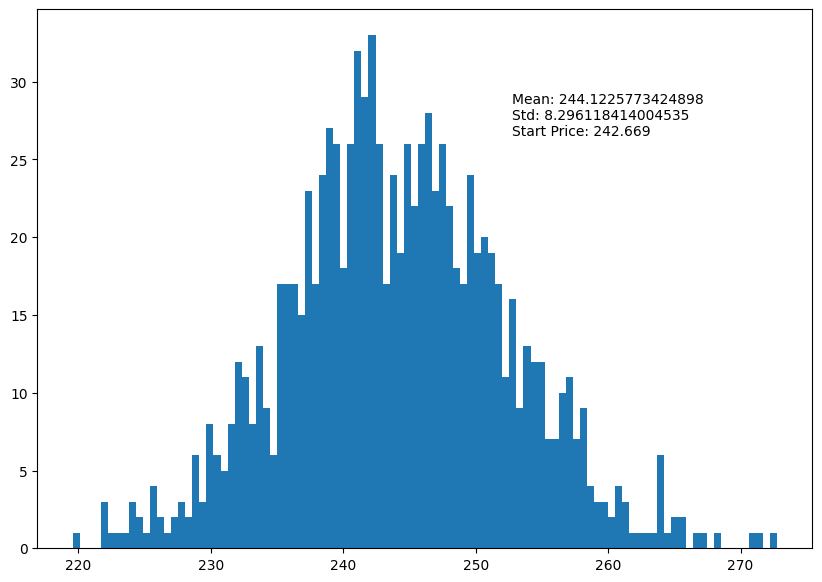

In [204]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for Microsoft')

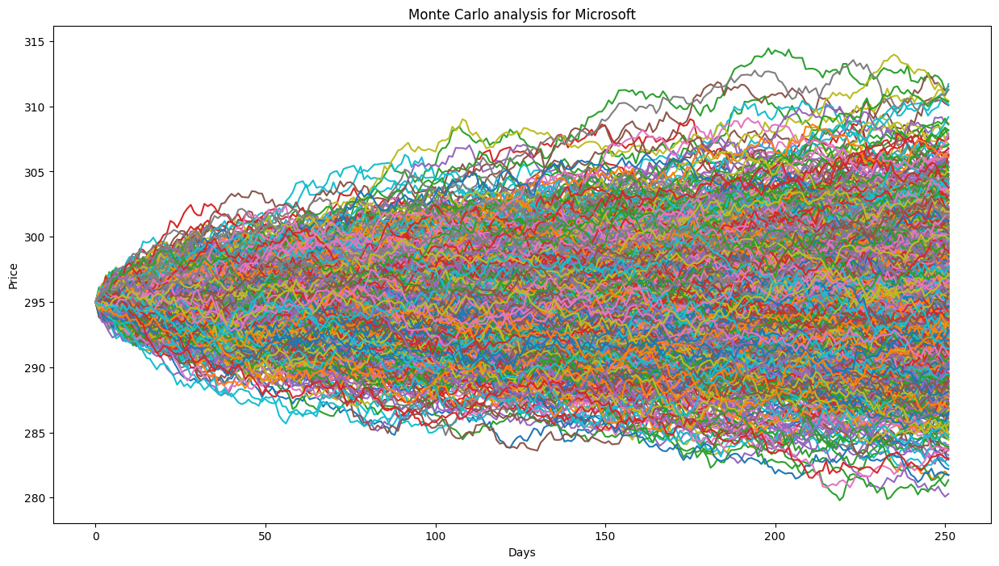

In [206]:
start_price = 295
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['msft_df'], sigma['msft_df'])
    sim[i] = result[days - 1]
    plt.plot(result)

plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Microsoft')

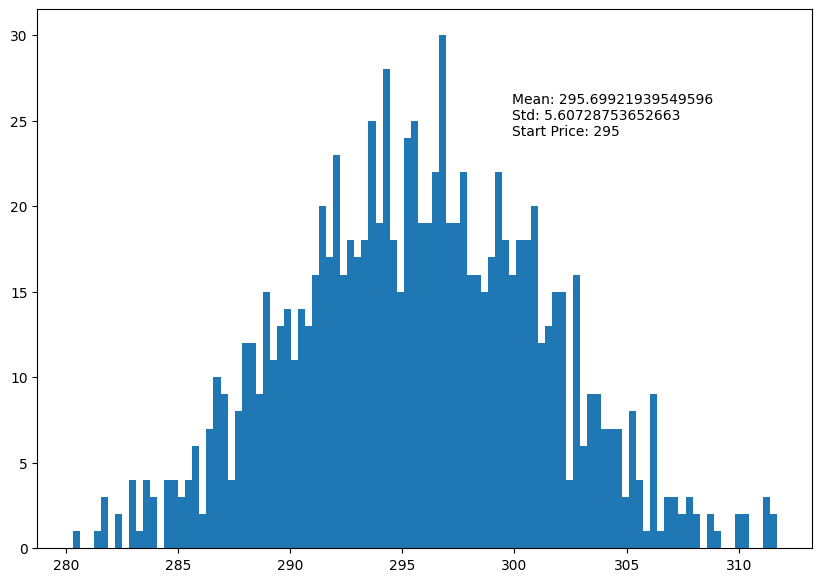

In [207]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for Meta')

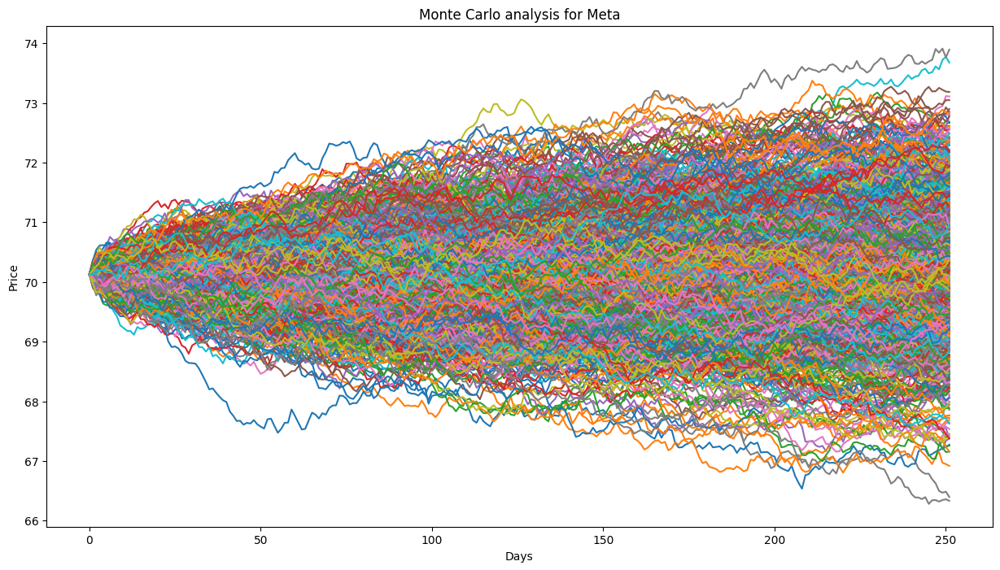

In [208]:
start_price = 70.129
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['met_df'], sigma['met_df'])
    sim[i] = result[days - 1]
    plt.plot(result)

plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Meta')

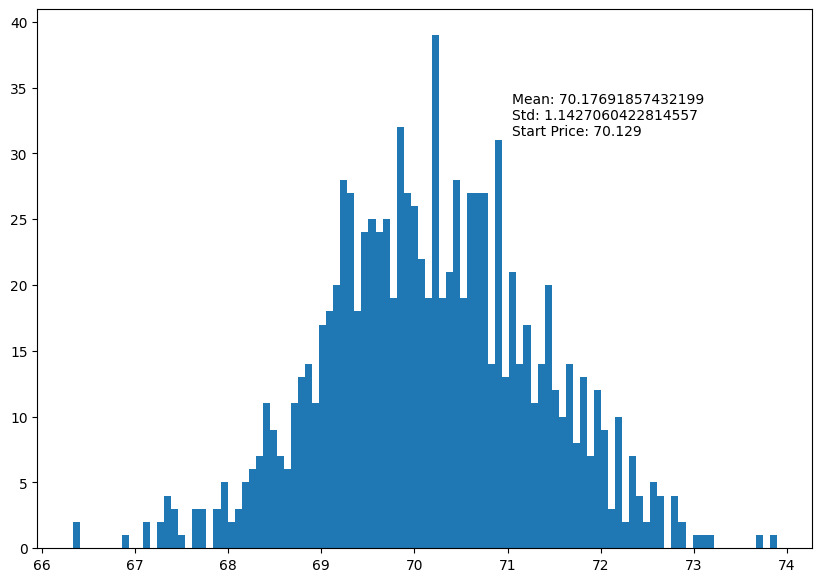

In [209]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for Amazon')

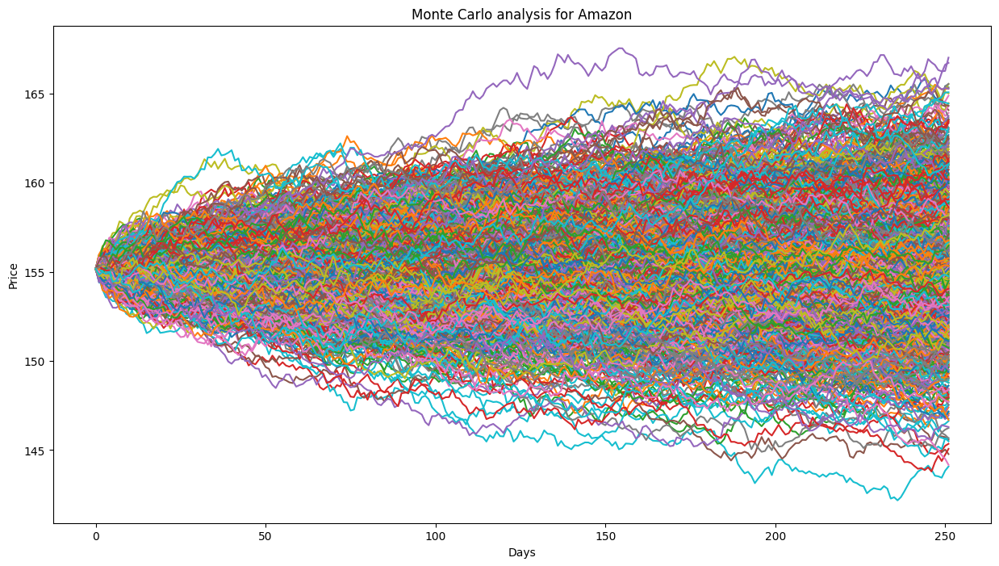

In [210]:
start_price = 155.167
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['amzn_df'], sigma['amzn_df'])
    sim[i] = result[days - 1]
    plt.plot(result)

plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Amazon')

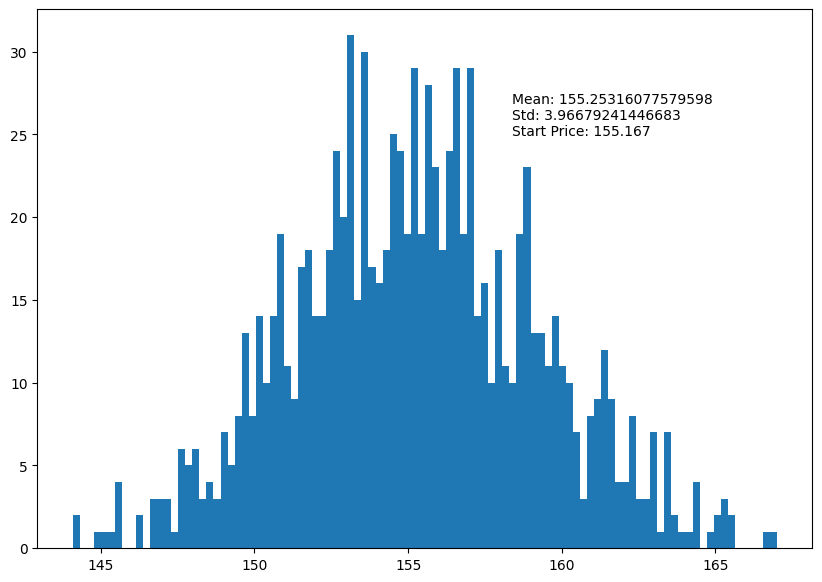

In [211]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for Google')

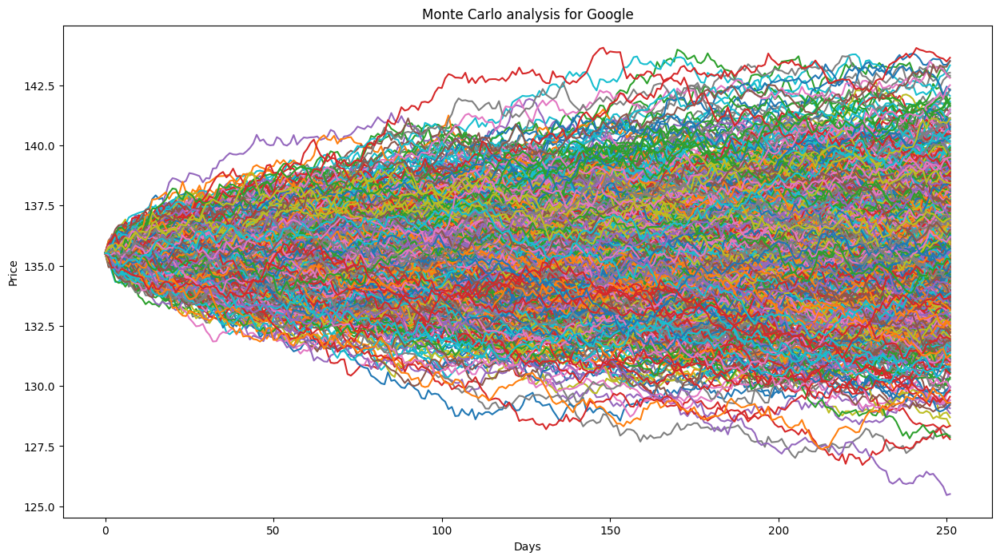

In [213]:
start_price = 135.526
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['googl_df'], sigma['googl_df'])
    sim[i] = result[days - 1]
    plt.plot(result)

plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Google')

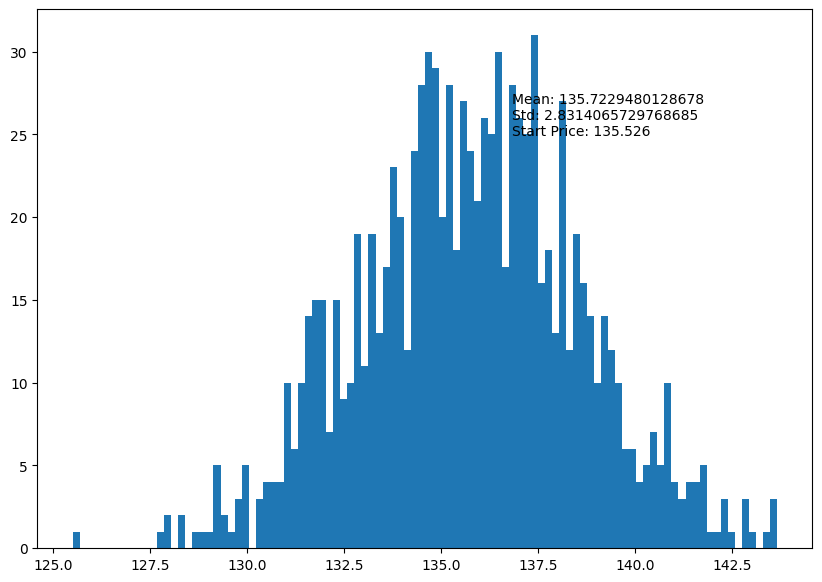

In [214]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for Tesla')

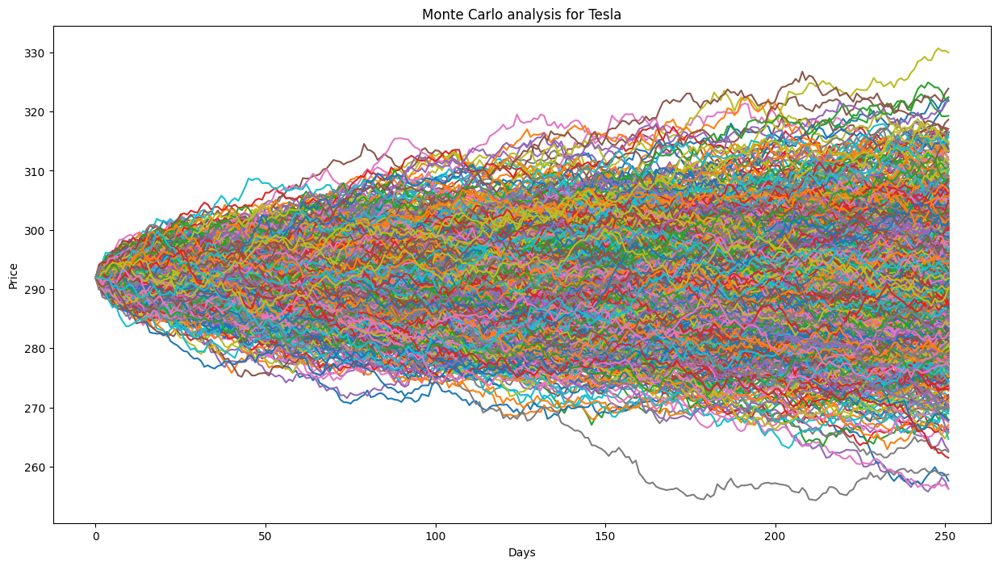

In [215]:
start_price = 291.92
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['tsla_df'], sigma['tsla_df'])
    sim[i] = result[days - 1]
    plt.plot(result)

plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Tesla')

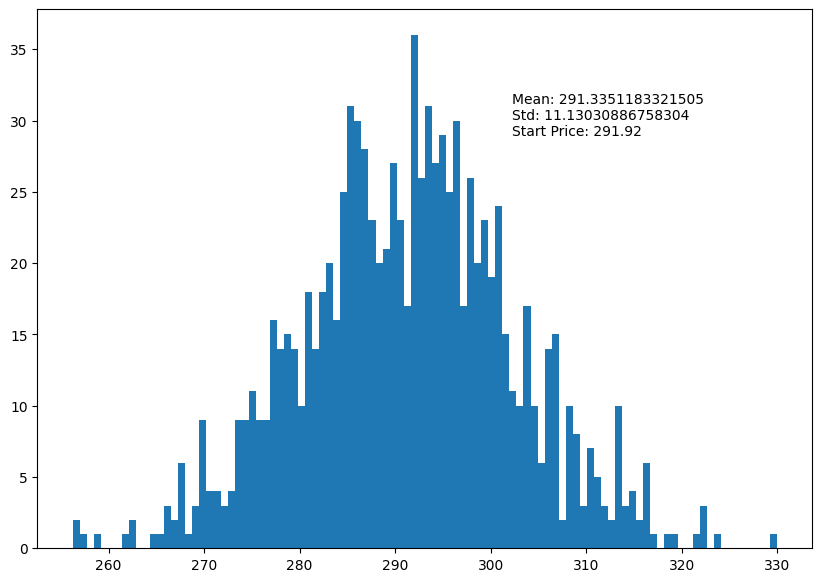

In [216]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()